<a href="https://colab.research.google.com/github/imashoodnasir/Fire-Detection-using-Machine-Learning/blob/main/FireDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os
import tensorflow as tf
from tensorflow.keras.preprocessing import image

sns.set_style('darkgrid')

In [2]:
# Configure kaggle
os.chdir('/root/')
!mkdir -p .kaggle
os.chdir('/root/.kaggle')
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1Y-o0TVcjehM8SZB3Nt8U3xkyeQu-Nse-' -O kaggle.json > /dev/null 2>&1
!ls /root/.kaggle

# Set permissions 
!chmod 600 /root/.kaggle/kaggle.json

# Create data folder
os.chdir('/content/')

kaggle.json


In [5]:
# Download data
!pip install -q kaggle
!kaggle datasets download -d atulyakumar98/test-dataset

403 - Forbidden


In [ ]:
!unzip '/content/test-dataset.zip' -d '/content/dataset/'

In [6]:
#create an empty DataFrame
df = pd.DataFrame(columns=['path','label'])

#loop over fire images and label them 1
for dirname, _, filenames in os.walk('/content/dataset/Fire-Detection/1'):
    for filename in filenames:
        #print(os.path.join(dirname, filename))
        df = df.append(pd.DataFrame([[os.path.join(dirname, filename),'fire']],columns=['path','label']))

#loop over non fire images and label them 0
for dirname, _, filenames in os.walk('/content/dataset/Fire-Detection/0'):
    for filename in filenames:
        df = df.append(pd.DataFrame([[os.path.join(dirname, filename),'non_fire']],columns=['path','label']))
        #print(os.path.join(dirname, filename))

#shuffle the dataset for redistribute the labels
df = df.sample(frac=1).reset_index(drop=True)
df.head(10)

,path,label
0,/content/dataset/Fire-Detection/1/109.jpg,fire
1,/content/dataset/Fire-Detection/0/236.jpg,non_fire
2,/content/dataset/Fire-Detection/1/105.png,fire
3,/content/dataset/Fire-Detection/0/82.jpg,non_fire
4,/content/dataset/Fire-Detection/0/228.jpg,non_fire
5,/content/dataset/Fire-Detection/1/90.jpg,fire
6,/content/dataset/Fire-Detection/0/158.jpg,non_fire
7,/content/dataset/Fire-Detection/1/83.jpg,fire
8,/content/dataset/Fire-Detection/0/425.jpg,non_fire
9,/content/dataset/Fire-Detection/0/74.jpg,non_fire


In [7]:
fig = px.scatter(data_frame = df,x=df.index,y='label',color='label',title='Distribution of fire and non-fire images along the length of the dataframe')
fig.update_traces(marker_size=2)

In [8]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])


fig.add_trace(go.Bar(x =df['label'].value_counts().index,y=df['label'].value_counts().to_numpy(),marker_color=['darkorange','green'],showlegend=False),row=1,col=1)

fig.add_trace(go.Pie(
     values=df['label'].value_counts().to_numpy(),
     labels=df['label'].value_counts().index,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

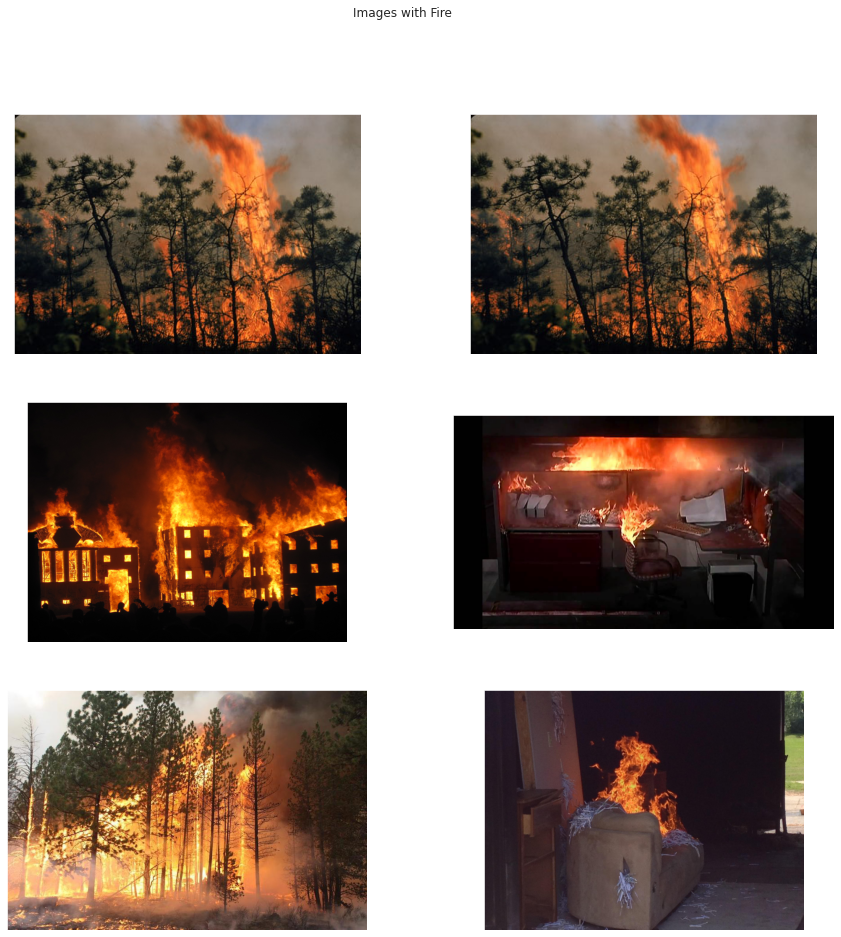

In [9]:
label = 'fire' #label for images with fire
data = df[df['label'] == label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images with Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = data.sample(1).loc[:,'path'].to_numpy()[0]
    img = image.load_img(path)
    img = image.img_to_array(img)/255
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

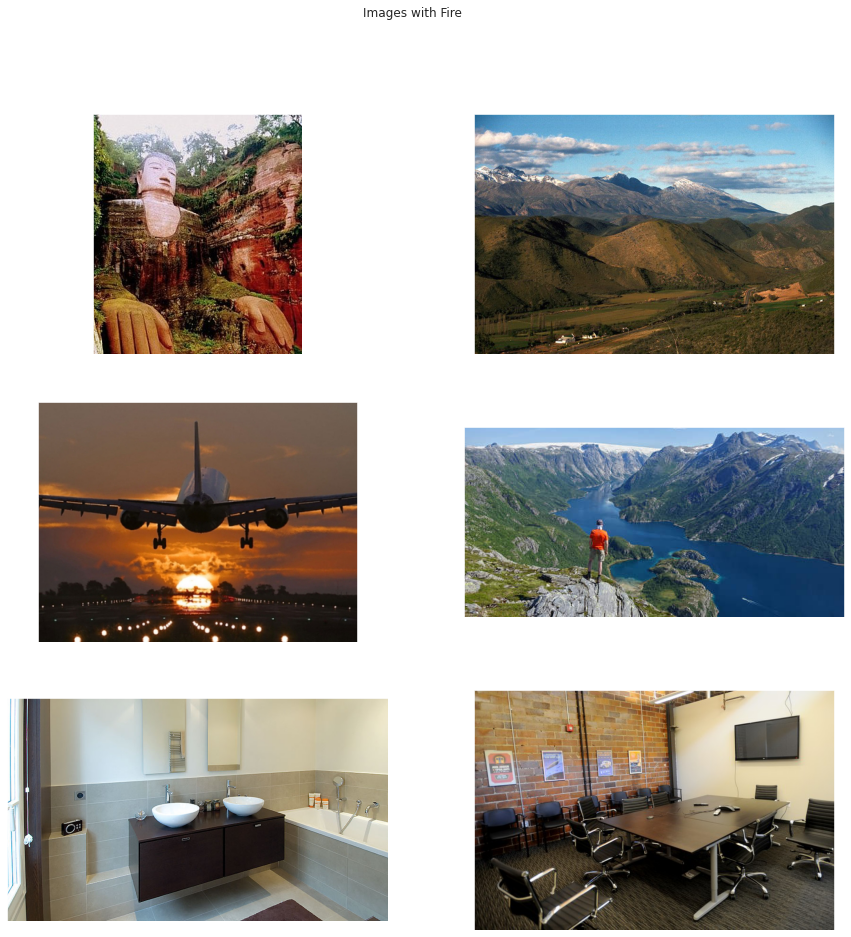

In [10]:
label = 'non_fire' #label for images without fire
data = df[df['label'] == label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images with Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = data.sample(1).loc[:,'path'].to_numpy()[0]
    img = image.load_img(path)
    img = image.img_to_array(img)/255
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

In [11]:
def shaper(row):
    shape = image.load_img(row['path']).size
    row['height'] = shape[1]
    row['width'] = shape[0]
    return row
df = df.apply(shaper,axis=1)
df.head(5)

,path,label,height,width
0,/content/dataset/Fire-Detection/1/109.jpg,fire,340,604
1,/content/dataset/Fire-Detection/0/236.jpg,non_fire,380,677
2,/content/dataset/Fire-Detection/1/105.png,fire,350,620
3,/content/dataset/Fire-Detection/0/82.jpg,non_fire,560,920
4,/content/dataset/Fire-Detection/0/228.jpg,non_fire,1080,1900


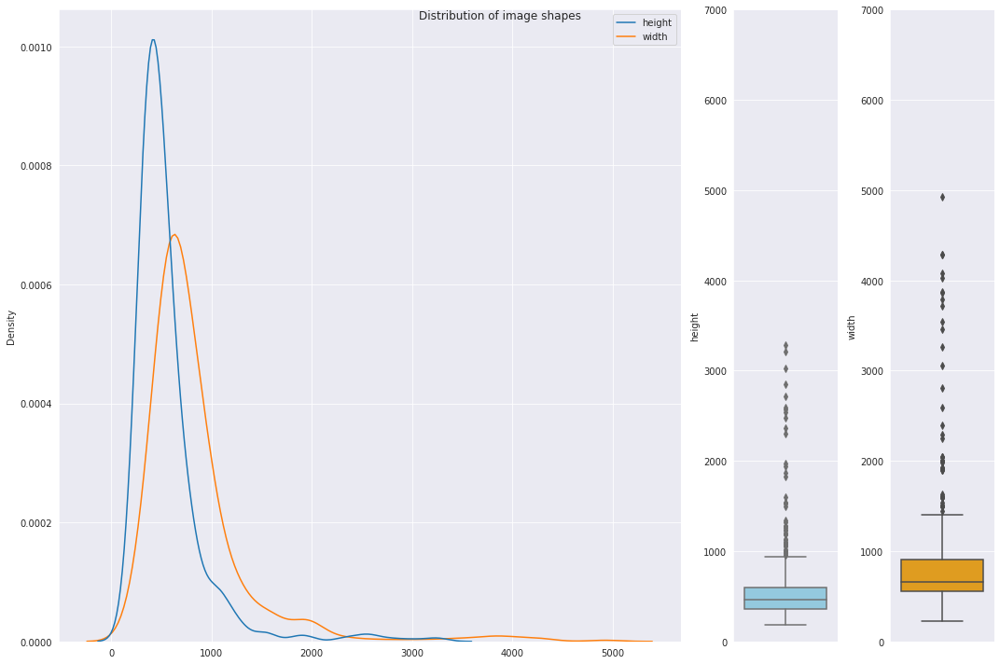

In [12]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=df,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,7000)
ax2.set_ylim(0,7000)
plt.tight_layout()

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [14]:
generator = ImageDataGenerator(
    rotation_range= 20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range = 2,
    zoom_range=0.2,
    rescale = 1/255,
    validation_split=0.2,
)

In [15]:
train_gen = generator.flow_from_dataframe(df,x_col='path',y_col='label',images_size=(256,256),class_mode='binary',subset='training')
val_gen = generator.flow_from_dataframe(df,x_col='path',y_col='label',images_size=(256,256),class_mode='binary',subset='validation')

Found 521 validated image filenames belonging to 2 classes.
Found 130 validated image filenames belonging to 2 classes.


In [16]:
class_indices = {}
for key in train_gen.class_indices.keys():
    class_indices[train_gen.class_indices[key]] = key
    
print(class_indices)

{0: 'fire', 1: 'non_fire'}


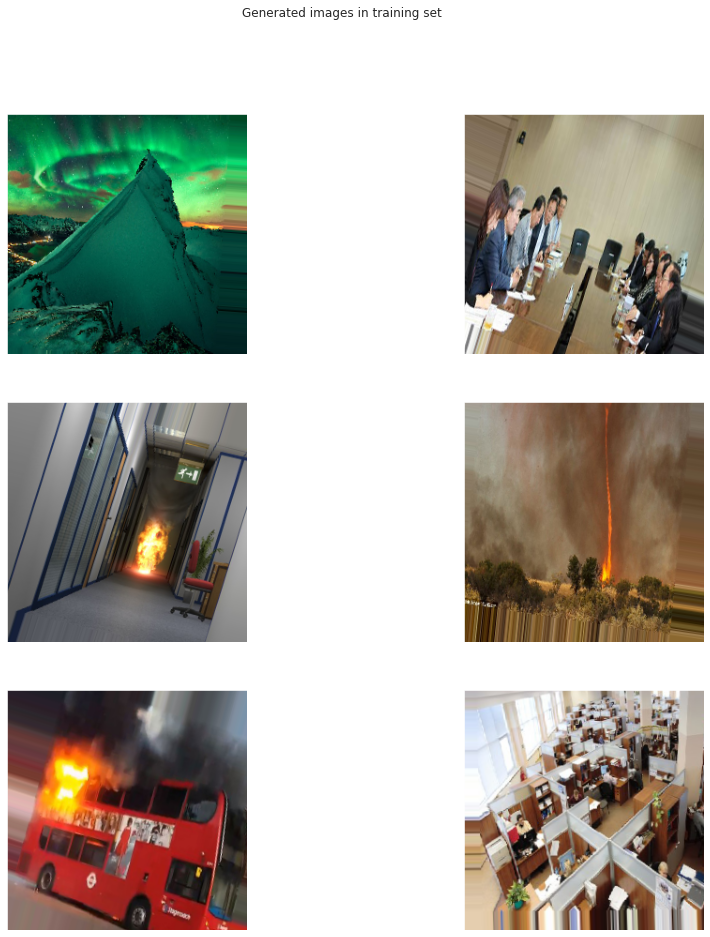

In [17]:
sns.set_style('dark')
pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Generated images in training set')
ax = ax.ravel()
for i in range((pics//2)*2):
    ax[i].imshow(train_gen[0][0][i])
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

In [18]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense

In [19]:
model = Sequential()
model.add(Conv2D(filters=32,kernel_size = (2,2),activation='relu',input_shape = (256,256,3)))
model.add(MaxPool2D())
model.add(Conv2D(filters=64,kernel_size=(2,2),activation='relu'))
model.add(MaxPool2D())
model.add(Conv2D(filters=128,kernel_size=(2,2),activation='relu'))
model.add(MaxPool2D())
model.add(Flatten())
model.add(Dense(64,activation='relu'))
model.add(Dense(32,activation = 'relu'))
model.add(Dense(1,activation = 'sigmoid'))

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 255, 255, 32)      416       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 126, 126, 64)      8256      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 63, 63, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 62, 62, 128)       32896     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 31, 31, 128)      0

In [21]:
from tensorflow.keras.metrics import Recall,AUC
from tensorflow.keras.utils import plot_model

In [22]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy',Recall(),AUC()])

In [24]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
early_stoppping = EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)
reduce_lr_on_plateau = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=5)

In [25]:
model.fit(x=train_gen,batch_size=32,epochs=15,validation_data=val_gen,callbacks=[early_stoppping,reduce_lr_on_plateau])

Epoch 1/15
17/17 [==============================] - 26s 986ms/step - loss: 0.5048 - accuracy: 0.8196 - recall: 0.9743 - auc: 0.6428 - val_loss: 0.2798 - val_accuracy: 0.8692 - val_recall: 1.0000 - val_auc: 0.9368 - lr: 0.0010
Epoch 2/15
17/17 [==============================] - 19s 1s/step - loss: 0.3427 - accuracy: 0.8503 - recall: 0.9836 - auc: 0.8514 - val_loss: 0.2537 - val_accuracy: 0.9077 - val_recall: 0.9558 - val_auc: 0.9459 - lr: 0.0010
Epoch 3/15
17/17 [==============================] - 19s 1s/step - loss: 0.3157 - accuracy: 0.8522 - recall: 0.9650 - auc: 0.8738 - val_loss: 0.2217 - val_accuracy: 0.8846 - val_recall: 0.9912 - val_auc: 0.9602 - lr: 0.0010
Epoch 4/15
17/17 [==============================] - 18s 1s/step - loss: 0.2566 - accuracy: 0.8906 - recall: 0.9860 - auc: 0.9192 - val_loss: 0.2476 - val_accuracy: 0.9077 - val_recall: 0.9204 - val_auc: 0.9516 - lr: 0.0010
Epoch 5/15
17/17 [==============================] - 21s 1s/step - loss: 0.2810 - accuracy: 0.8983 - recal

In [26]:
history= model.history.history
px.line(history,title = "Metrics Plot")

In [27]:
eval_list = model.evaluate(val_gen,return_dict=True)
for metric in eval_list.keys():
    print(metric+f": {eval_list[metric]:.2f}")

5/5 [==============================] - 3s 492ms/step - loss: 0.1753 - accuracy: 0.9385 - recall: 0.9646 - auc: 0.9558
loss: 0.18
accuracy: 0.94
recall: 0.96
auc: 0.96


In [28]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dropout

In [29]:
xception = Xception(include_top = False,input_shape = (256,256,3))
input_to_model = xception.input
#turn off training
xception.trainable = False

x = Flatten()(xception.output)
x = Dense(64,activation = 'relu')(x)
output_to_model = Dense(1,activation = 'sigmoid')(x)
model2 = Model(inputs = input_to_model,outputs = output_to_model)

83683744/83683744 [==============================] - 3s 0us/step


In [30]:
model2.compile(optimizer = 'adam',loss = 'binary_crossentropy',metrics = ['accuracy',Recall(),AUC()])

In [31]:
history2 = model2.fit(x = train_gen,batch_size=32,epochs=15,callbacks = [early_stoppping,reduce_lr_on_plateau],validation_data = val_gen)

Epoch 1/15
17/17 [==============================] - 24s 1s/step - loss: 1.1352 - accuracy: 0.8388 - recall_1: 0.8949 - auc_1: 0.8211 - val_loss: 0.7297 - val_accuracy: 0.8769 - val_recall_1: 0.8938 - val_auc_1: 0.8766 - lr: 0.0010
Epoch 2/15
17/17 [==============================] - 19s 1s/step - loss: 0.4098 - accuracy: 0.9098 - recall_1: 0.9439 - auc_1: 0.9326 - val_loss: 0.2596 - val_accuracy: 0.9385 - val_recall_1: 0.9912 - val_auc_1: 0.9014 - lr: 0.0010
Epoch 3/15
17/17 [==============================] - 18s 1s/step - loss: 0.1575 - accuracy: 0.9386 - recall_1: 0.9463 - auc_1: 0.9798 - val_loss: 0.2022 - val_accuracy: 0.9462 - val_recall_1: 0.9912 - val_auc_1: 0.9602 - lr: 0.0010
Epoch 4/15
17/17 [==============================] - 18s 1s/step - loss: 0.0625 - accuracy: 0.9731 - recall_1: 0.9907 - auc_1: 0.9964 - val_loss: 0.0990 - val_accuracy: 0.9462 - val_recall_1: 0.9646 - val_auc_1: 0.9865 - lr: 0.0010
Epoch 5/15
17/17 [==============================] - 18s 1s/step - loss: 0.07

In [32]:
px.line(history,title='Metrics Plot')

In [37]:
eval_list = model2.evaluate(val_gen,return_dict=True)
for metric in eval_list.keys():
    print(metric+f": {eval_list[metric]:.2f}")

5/5 [==============================] - 3s 555ms/step - loss: 0.1347 - accuracy: 0.9538 - recall_1: 0.9735 - auc_1: 0.9560
loss: 0.13
accuracy: 0.95
recall_1: 0.97
auc_1: 0.96


In [34]:
#Downloading the image
!curl https://static01.nyt.com/images/2021/02/19/world/19storm-briefing-texas-fire/19storm-briefing-texas-fire-articleLarge.jpg --output predict.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 50241  100 50241    0     0   195k      0 --:--:-- --:--:-- --:--:--  194k


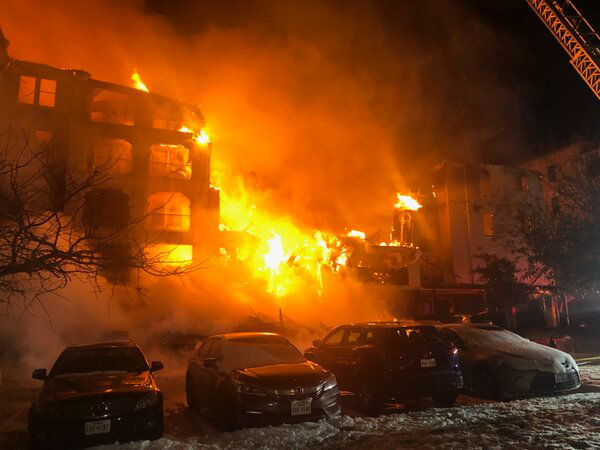

In [38]:
#loading the image
img = image.load_img('predict.jpg')
img

In [39]:
img = image.img_to_array(img)/255
img = tf.image.resize(img,(256,256))
img = tf.expand_dims(img,axis=0)

print("Image Shape",img.shape)

Image Shape (1, 256, 256, 3)


In [40]:
prediction = int(tf.round(model2.predict(x=img)).numpy()[0][0])
print("The predicted value is: ",prediction,"and the predicted label is:",class_indices[prediction])

1/1 [==============================] - 3s 3s/step
The predicted value is:  0 and the predicted label is: fire


In [47]:
#Downloading the image
!curl https://images.pexels.com/photos/1212600/pexels-photo-1212600.jpeg --output predict2.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1927k  100 1927k    0     0  22.9M      0 --:--:-- --:--:-- --:--:-- 22.9M


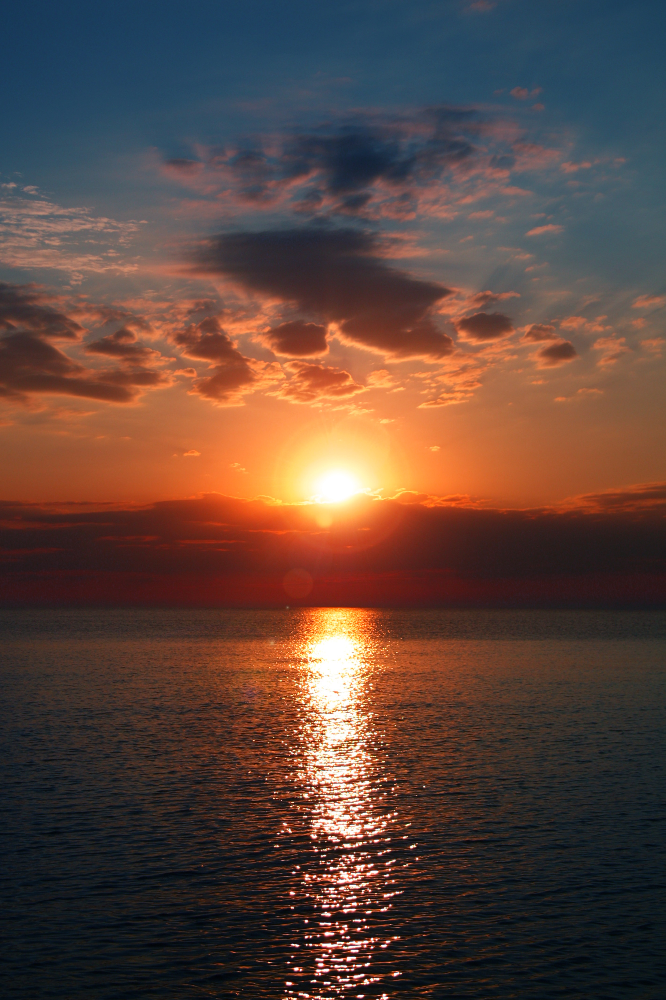

In [48]:
#loading the image
img = image.load_img('/content/predict2.jpg')
img

In [ ]:
img = image.img_to_array(img)/255
img = tf.image.resize(img,(256,256))
img = tf.expand_dims(img,axis=0)

print("Image Shape",img.shape)

In [ ]:
prediction = int(tf.round(model2.predict(x=img)).numpy()[0][0])
print("The predicted value is: ",prediction,"and the predicted label is:",class_indices[prediction])